## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

In [1]:
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import glob
import os
%matplotlib inline

## Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.

In [2]:
os.listdir('./camera_cal')

['calibration1.jpg',
 'calibration7.jpg',
 'calibration19.jpg',
 'calibration14.jpg',
 'calibration17.jpg',
 'calibration4.jpg',
 'calibration20.jpg',
 'calibration3.jpg',
 'calibration18.jpg',
 'calibration12.jpg',
 'calibration10.jpg',
 'calibration5.jpg',
 'calibration9.jpg',
 'calibration15.jpg',
 'calibration13.jpg',
 'calibration2.jpg',
 'calibration6.jpg',
 'calibration8.jpg',
 'calibration16.jpg',
 'calibration11.jpg']

There are 20 images from which we can calibrate

(720, 1280, 3)


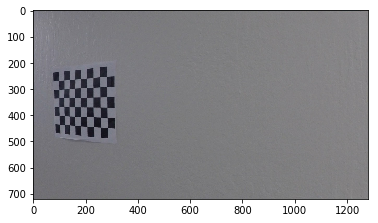

In [3]:
img = mpimg.imread('camera_cal/calibration11.jpg')
image_shape = img.shape
print(image_shape)
plt.imshow(img)

In [4]:
# Make a list of calibration images
images = glob.glob('./camera_cal/calibration*.jpg')

## Exploration

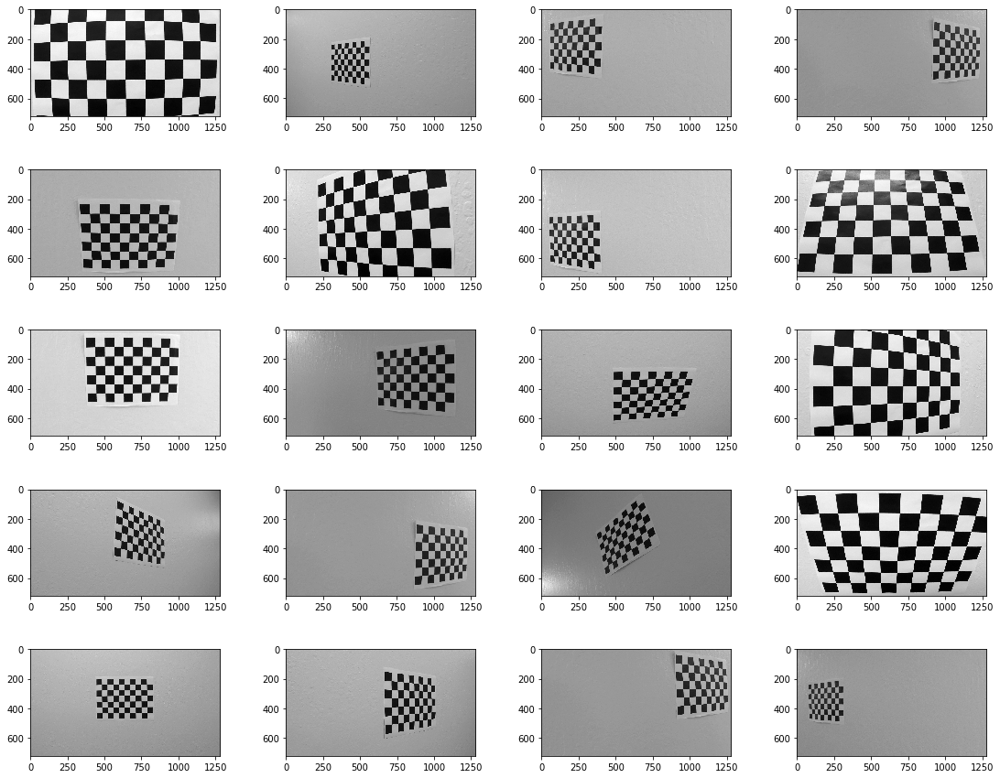

In [5]:
#Display all the images 

fig, axis = plt.subplots(5, 4, figsize=(20,15))
fig.subplots_adjust(hspace = .5, wspace=.001)
axis = axis.ravel()
for i in range(len(images)):
    img = cv2.imread(images[i])
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    axis[i].imshow(gray.squeeze(), cmap='gray')

## Caliberation

We can observe that there are 9 corners in a row and 6 corners in a column. I have used `glob` to iterate over all the `camera_cal` images to extract the object and image points

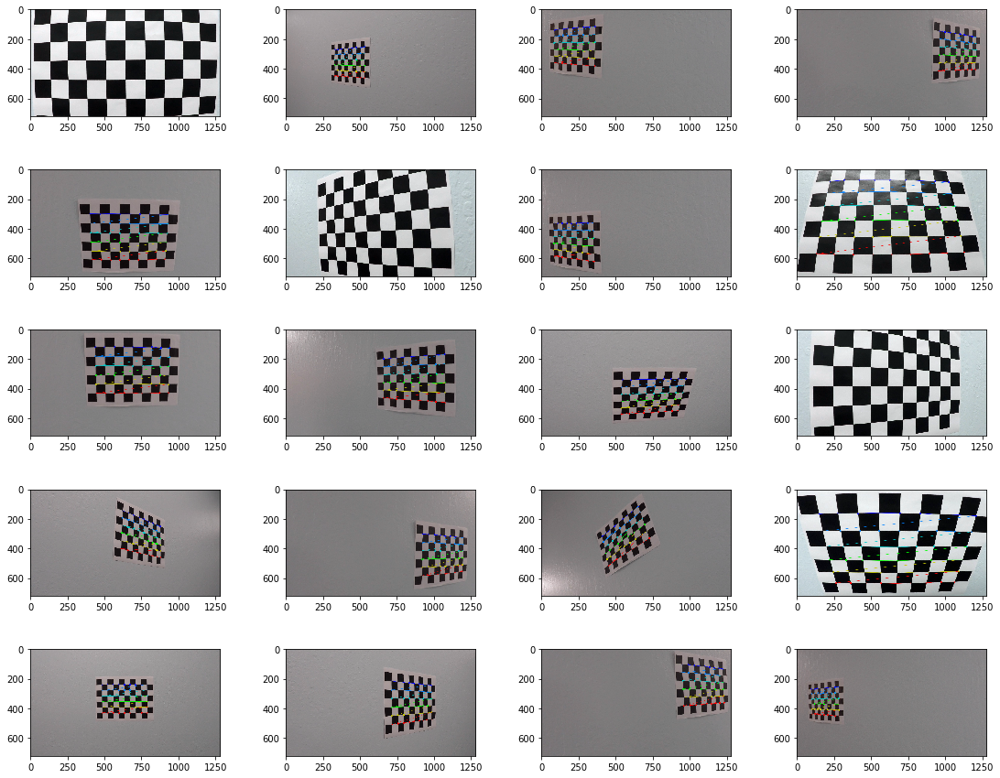

In [6]:
# compute the camera calibration using chessboard images
nx = 9
ny = 6

objpoints = []
imgpoints = []

objp = np.zeros((nx*ny,3), np.float32)
objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2)

fig, axis = plt.subplots(5, 4, figsize=(20,15))
fig.subplots_adjust(hspace = .5, wspace=.001)
axis = axis.ravel()
for i in range(len(images)):
    img = cv2.imread(images[i])
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        axis[i].imshow(img.squeeze())
    else:
        axis[i].imshow(img.squeeze())   
    

In [7]:
# use the object and image points to caliberate the camera and 
# compute the camera matrix and distortion coefficients
ret, cameraMatrix, distortionCoeffs, rvecs, tvecs = cv2.calibrateCamera(objpoints, 
                                                                        imgpoints, 
                                                                        image_shape[:2],
                                                                        None,None)

## Distortion Correction Example

We use the `cameraMatrix` and `distortionCoeffs` to undistort the image.

In [8]:
def undistort_image(image):
    return cv2.undistort(image, cameraMatrix, distortionCoeffs, None, cameraMatrix)

def draw_images(left_image,right_image,left_title='Original Image', right_title = 'Changed Image',
               left_gray = False,right_gray = False):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    if left_gray:
        ax1.imshow(left_image, cmap='gray')
    else:
        ax1.imshow(left_image)
    ax1.set_title(left_title, fontsize=50)
    if right_gray:
        ax2.imshow(right_image, cmap='gray')
    else:
        ax2.imshow(right_image)
    ax2.set_title(right_title, fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    

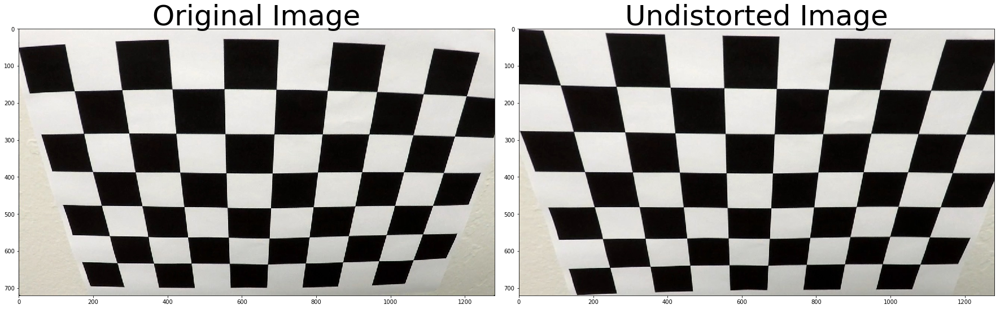

In [9]:
img = mpimg.imread('camera_cal/calibration2.jpg')
undistorted = undistort_image(img)
draw_images(img,undistorted, right_title='Undistorted Image')

# Apply a distortion correction to raw images

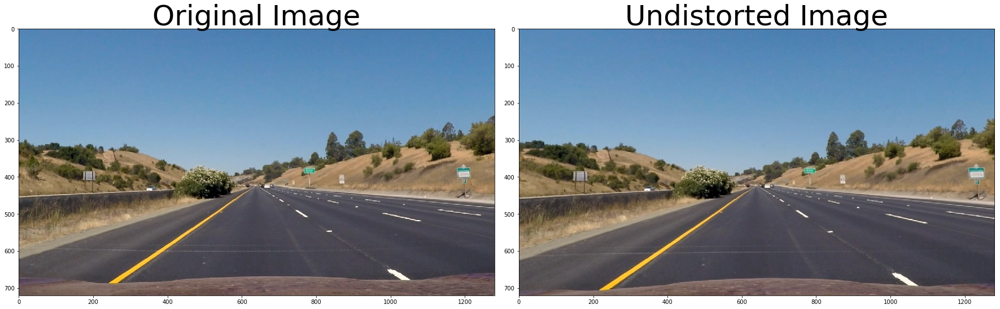

In [10]:
img = mpimg.imread('test_images/straight_lines1.jpg')
undistorted = undistort_image(img)
draw_images(img,undistorted, right_title='Undistorted Image')

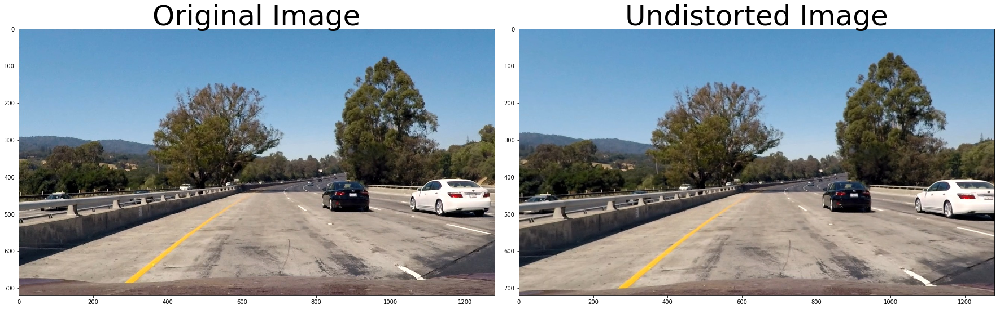

In [11]:
img = mpimg.imread('test_images/test1.jpg')
undistorted = undistort_image(img)
draw_images(img,undistorted, right_title='Undistorted Image')

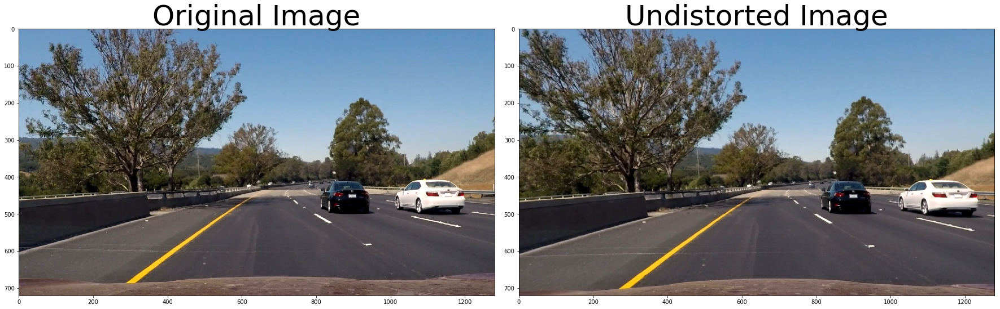

In [12]:
img = mpimg.imread('test_images/test6.jpg')
undistorted = undistort_image(img)
draw_images(img,undistorted, right_title='Undistorted Image')

## Gradients and color transforms

We use 2 kinds of gradient thresholds:

- Along the X axis.
- Directional gradient with thresholds of 30 and 90 degrees.

This is done since the lane lines are more or less vertical.

We then apply the following color thresholds:

- R & G channel thresholds so that yellow lanes are detected well.
- L channel threshold so that we don't take into account edges generated due to shadows.
- S channel threshold since it does a good job of separating out white & yellow lanes.

In [13]:
def straight_threshold(gray, orient='x', thresh_min=0, thresh_max=255):
    if orient == 'x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    else:
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
    abs_sobel = np.absolute(sobel)
    max_value = np.max(abs_sobel)
    binary_output = np.uint8(255*abs_sobel/max_value)
    threshold_mask = np.zeros_like(binary_output)
    threshold_mask[(binary_output >= thresh_min) & (binary_output <= thresh_max)] = 1
    return threshold_mask

def angled_threshold(gray, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Take the gradient in x and y separately
    sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Take the absolute value of the x and y gradients
    abs_sobel_x = np.absolute(sobel_x)
    abs_sobel_y = np.absolute(sobel_y)
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient
    direction = np.arctan2(abs_sobel_y,abs_sobel_x)
    direction = np.absolute(direction)
    # 5) Create a binary mask where direction thresholds are met
    mask = np.zeros_like(direction)
    mask[(direction >= thresh[0]) & (direction <= thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    return mask

In [14]:
def threshold_image(img):
    
    # apply undistory pipeline
    img = undistort_image(img)
    
    # convert to gray scale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    height, width = gray.shape
    
    # apply gradient threshold on the horizontal gradient
    sx_binary = straight_threshold(gray, 'x', 10, 200)
    
    # apply gradient direction threshold so that only edges closer to vertical are detected.
    dir_binary = angled_threshold(gray, thresh=(np.pi/6, np.pi/2))
    
    # combine the gradient and direction thresholds.
    combined_condition = ((sx_binary == 1) & (dir_binary == 1))
    
    # R & G thresholds so that yellow lanes are detected well.
    color_threshold = 150
    R = img[:,:,0]
    G = img[:,:,1]
    color_combined = np.zeros_like(R)
    r_g_condition = (R > color_threshold) & (G > color_threshold)
    
    
    # color channel thresholds
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    S = hls[:,:,2]
    L = hls[:,:,1]
    
    # S channel performs well for detecting bright yellow and white lanes
    s_thresh = (100, 255)
    s_condition = (S > s_thresh[0]) & (S <= s_thresh[1])
    
    # We put a threshold on the L channel to avoid pixels which have shadows and as a result darker.
    l_thresh = (120, 255)
    l_condition = (L > l_thresh[0]) & (L <= l_thresh[1])

    # combine all the thresholds
    # A pixel should either be a yellowish or whiteish
    # And it should also have a gradient, as per our thresholds
    color_combined[(r_g_condition & l_condition) & (s_condition | combined_condition)] = 1
    
    # apply the region of interest mask
    mask = np.zeros_like(color_combined)
    region_of_interest_vertices = np.array([[0,height-1], 
                                            [width/2, int(0.5*height)], 
                                            [width-1, height-1]], dtype=np.int32)
    cv2.fillPoly(mask, [region_of_interest_vertices], 1)
    thresholded = cv2.bitwise_and(color_combined, mask)
    
    return thresholded

# Use color transforms, gradients, to create a thresholded binary image.

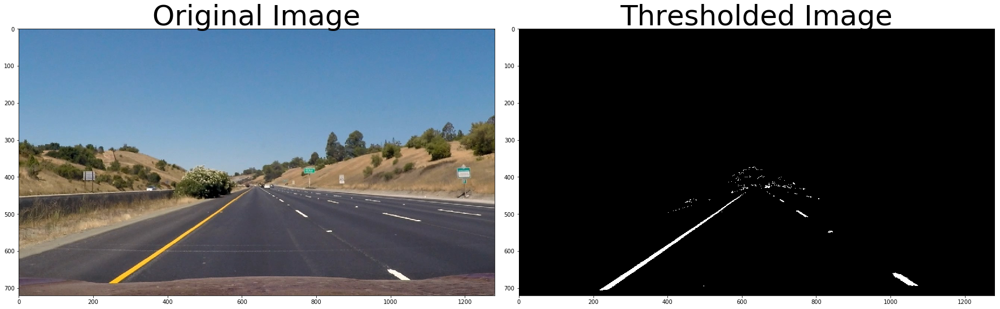

In [15]:
img = mpimg.imread('test_images/straight_lines1.jpg')
thresholded = threshold_image(img)
draw_images(img,thresholded, right_title='Thresholded Image', right_gray=True)

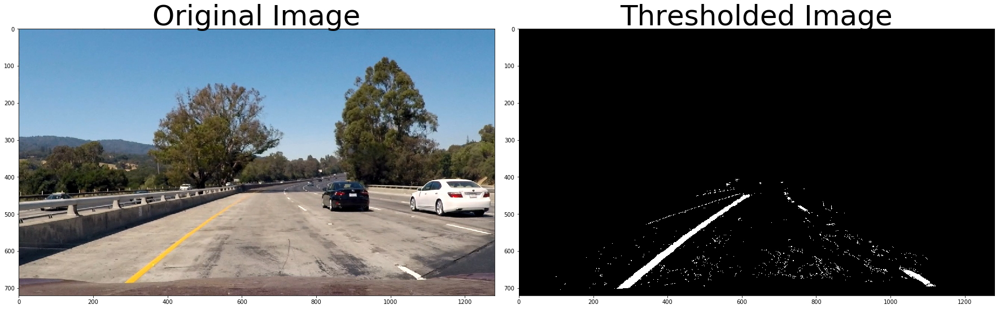

In [16]:
img = mpimg.imread('test_images/test1.jpg')
thresholded = threshold_image(img)
draw_images(img,thresholded, right_title='Thresholded Image', right_gray=True)

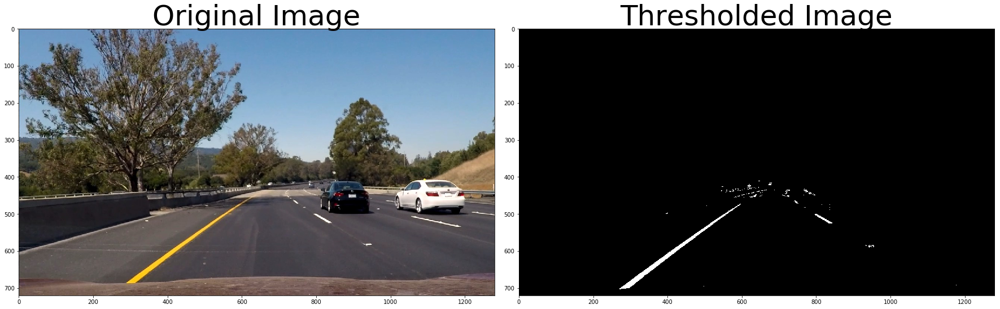

In [17]:
img = mpimg.imread('test_images/test6.jpg')
thresholded = threshold_image(img)
draw_images(img,thresholded, right_title='Thresholded Image', right_gray=True)

## Perspective Transform

(720, 1280, 3)


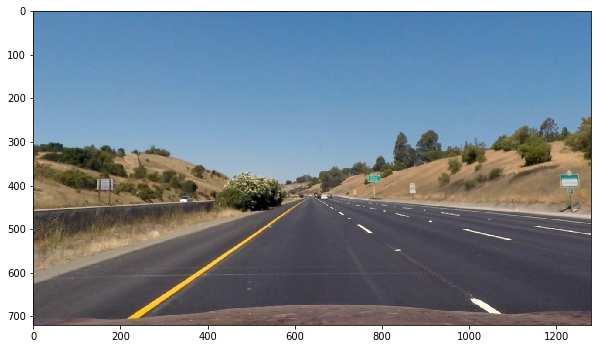

In [45]:
# Sample Image

img = mpimg.imread('test_images/straight_lines1.jpg')
img = undistort_image(img)
image_shape = img.shape
print(image_shape)
plt.figure(figsize=(10,10))
plt.imshow(img)

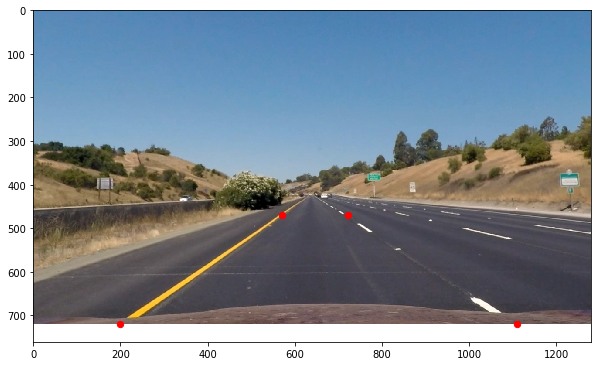

In [46]:
# Extract vertices manually for performing a perspective transform
src_bottom_left = [220,720]
src_bottom_right = [1110, 720]
src_top_left = [570, 470]
src_top_right = [722, 470]
copy = img.copy()
plt.figure(figsize=(10,10))
plt.imshow(copy)
plt.scatter([200,1110,570,722],[720,720,470,470],marker='o', c='red', s=40)

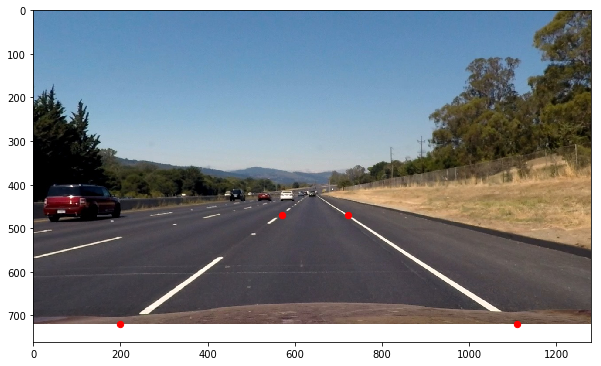

In [47]:
# Lets determine if the same vertices fit for other sample image

img = mpimg.imread('test_images/straight_lines2.jpg')
img = undistort_image(img)
copy = img.copy()
plt.figure(figsize=(10,10))
plt.imshow(copy)
plt.scatter([200,1110,570,722],[720,720,470,470],marker='o', c='red', s=40)

In [48]:
original = mpimg.imread('test_images/straight_lines1.jpg')
undistorted = undistort_image(original)
thresholded = threshold_image(original)

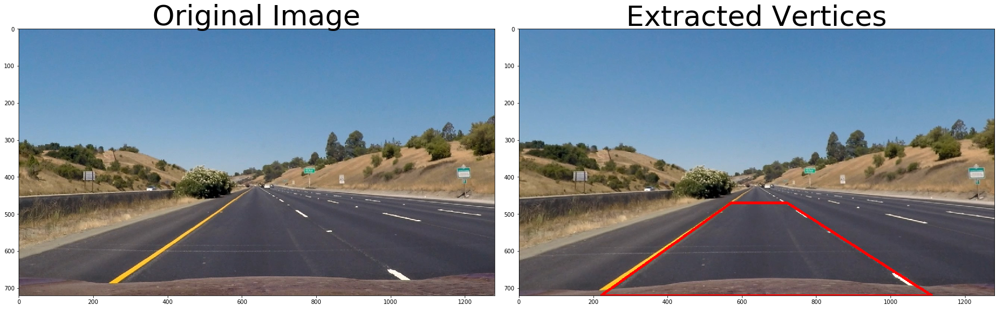

In [49]:
src = np.float32([src_bottom_left,src_bottom_right,src_top_right,src_top_left])
pts = np.array([src_bottom_left,src_bottom_right,src_top_right,src_top_left], np.int32)
pts = pts.reshape((-1,1,2))
copy = undistorted.copy()
cv2.polylines(copy,[pts],True,(255,0,0), thickness=5)

draw_images(original, copy, right_title = 'Extracted Vertices')

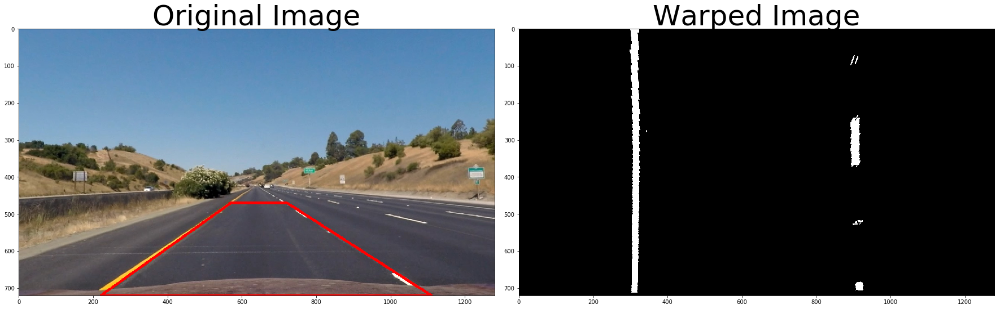

In [50]:
# Destination points are chosen such that straight lanes appear more or less parallel in the transformed image.
dst_bottom_left = [320,720]
dst_bottom_right = [920, 720]
dst_top_left = [320, 1]
dst_top_right = [920, 1]

image_shape = original.shape

dst = np.float32([dst_bottom_left,dst_bottom_right,dst_top_right,dst_top_left])

M = cv2.getPerspectiveTransform(source, dst)
M_inv = cv2.getPerspectiveTransform(dst, source)
img_size = (image_shape[1], image_shape[0])

warped = cv2.warpPerspective(thresholded, M, img_size , flags=cv2.INTER_LINEAR)

draw_images(copy, warped, right_title='Warped Image', right_gray=True)

In [60]:
src_bottom_left = [220,720]
src_bottom_right = [1110, 720]
src_top_left = [570, 470]
src_top_right = [722, 470]

dst_bottom_left = [320,720]
dst_bottom_right = [920, 720]
dst_top_left = [320, 1]
dst_top_right = [920, 1]

src = np.float32([src_bottom_left,src_bottom_right,src_top_right,src_top_left])
dst = np.float32([dst_bottom_left,dst_bottom_right,dst_top_right,dst_top_left])

M = cv2.getPerspectiveTransform(src, dst)
M_inv = cv2.getPerspectiveTransform(dst, src)

def warp_image(image):
    copy = image.copy()
    image_shape = image.shape

    img_size = (image_shape[1], image_shape[0])
    warped = cv2.warpPerspective(threshold_image(copy), M, img_size , flags=cv2.INTER_LINEAR)
    return warped

def poly_image(image):
    pts = np.array([src_bottom_left,src_bottom_right,src_top_right,src_top_left], np.int32)
    pts = pts.reshape((-1,1,2))
    copy = undistort_image(image)
    cv2.polylines(copy,[pts],True,(255,0,0), thickness=5)
    return copy    

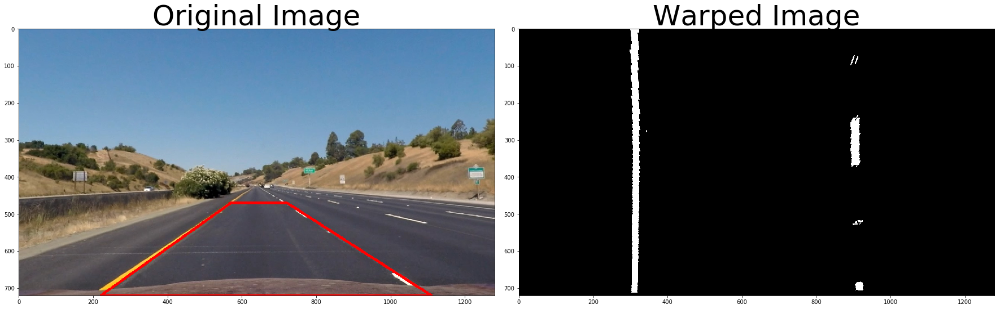

In [58]:
img = mpimg.imread('test_images/straight_lines1.jpg')
original = poly_image(img)
warped = warp_image(img)
draw_images(original,warped, right_title='Warped Image', right_gray=True)

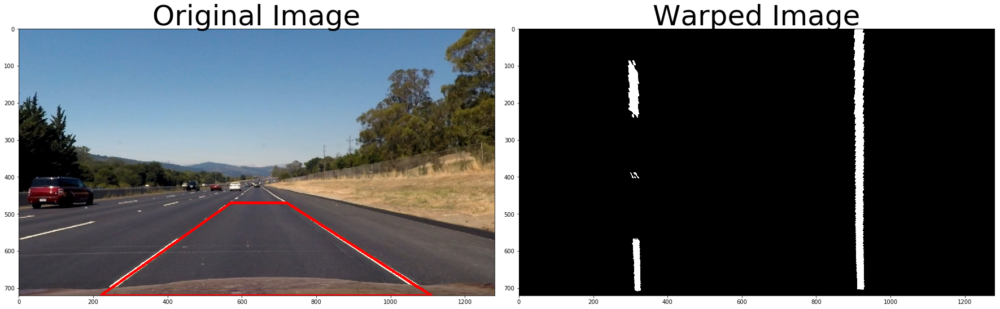

In [59]:
img = mpimg.imread('test_images/straight_lines2.jpg')
original = poly_image(img)
warped = warp_image(img)
draw_images(original,warped, right_title='Warped Image', right_gray=True)